In [1]:
%matplotlib notebook
import numpy as np
import matplotlib.pyplot as plt
from lcls_beamline_toolbox.xraybeamline2d import beam, optics, beamline2d
import h5py

Can't find epics package. PPM_Imager class will not be supported


In [57]:
N = 4096
FOV = 10e-3
dx = FOV/N

E0 = 8800.

beam_params = {
    'photonEnergy': E0,
    'cx': 0e-6,
    'cy': 0e-6,
    'ax': 0.e-6,
    'ay': 0e-6,
    'N': N,
    'sigma_x': 20e-6,
    'sigma_y': 20e-6,
    'z0x': 110,
    'z0y': 110,
    'rangeFactor': 5,
    'scaleFactor': 20,
    'z_source': 630
}

(1500, 2)


<IPython.core.display.Javascript object>


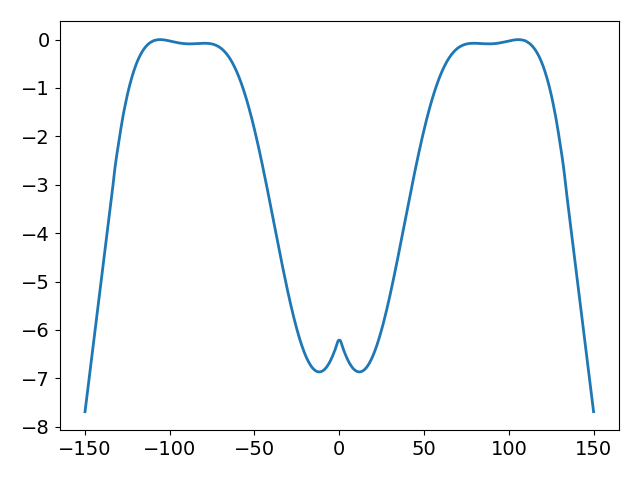

<IPython.core.display.Javascript object>


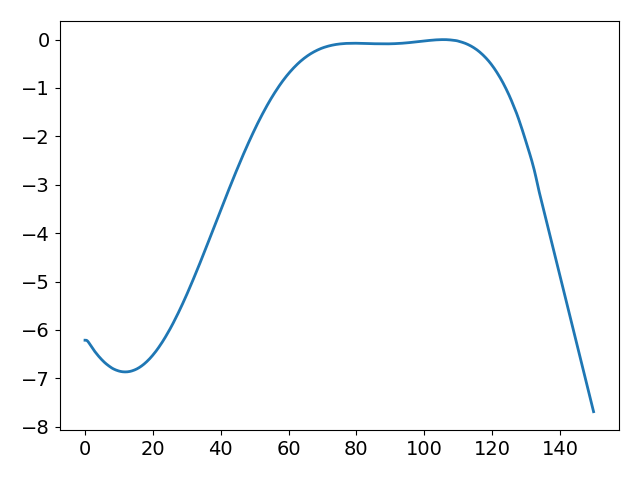

<IPython.core.display.Javascript object>


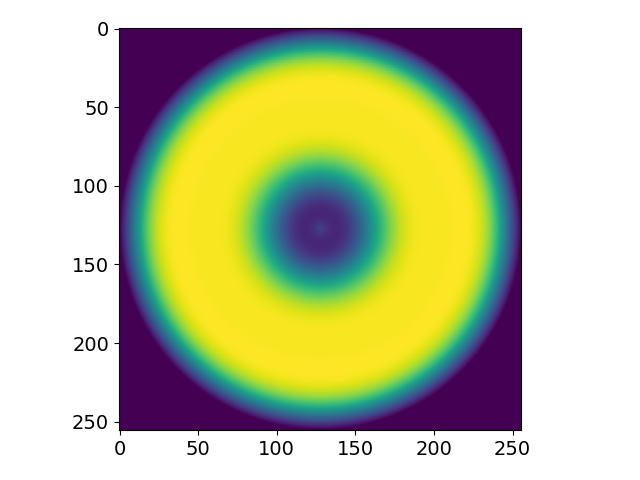

3.7766919687119357e-06


<IPython.core.display.Javascript object>


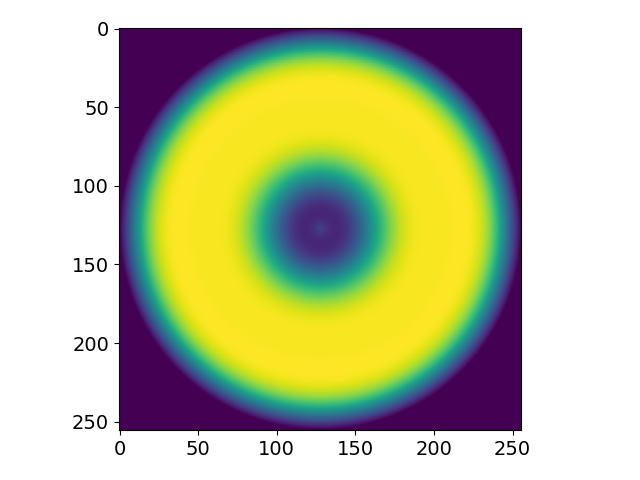

<IPython.core.display.Javascript object>


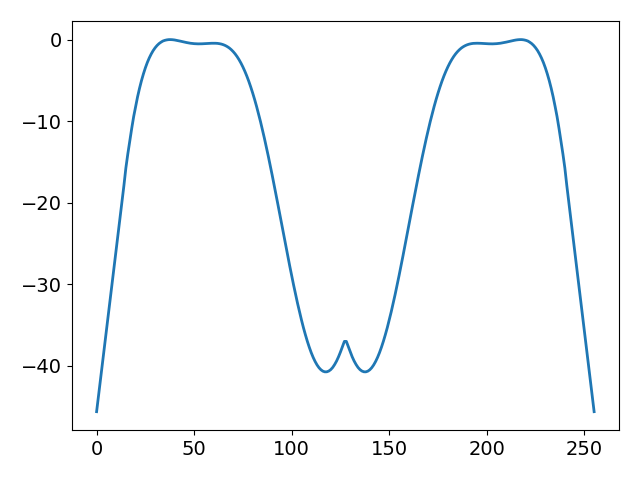

In [3]:
data = np.loadtxt('20_Be-CRL_9.5keV_LCLS_phase_smooth.txt')
print(data.shape)
plate = np.zeros(3000)
x = np.zeros(3000)
plate[0:1500] = data[::-1,1]
plate[1500:] = data[:,1]
x[0:1500] = data[::-1,0]*-1
x[1500:] = data[:,0]

plt.figure()
plt.plot(x,plate)

plt.figure()
plt.plot(data[:,0],data[:,1])

N = 256
x2 = np.linspace(-1,1,N)

x,y = np.meshgrid(x2,x2)
r = np.sqrt(x**2+y**2)

test = np.reshape(np.interp(r.flatten(),data[:,0]/np.max(data[:,0]),data[:,1]),x.shape)
plt.figure()
plt.imshow(test)

phasePerLens = test/20

test_lens = optics.CRL('test')
delta = np.interp(9500, test_lens.energy, test_lens.delta)
print(delta)

lambda0 = 1239.8/E0*1e-9

lens_shape = lambda0*phasePerLens/2/np.pi/delta

plt.figure()
plt.imshow(lens_shape*1e6)

plt.figure()
plt.plot(lens_shape[128,:]*1e6*20)

In [52]:
b1 = beam.Beam(beam_params=beam_params)

mr1l0 = optics.FlatMirror('mr1l0', length=1, alpha=2.1e-3, z=740,delta=0e-9)
mr2l0 = optics.FlatMirror('mr2l0', length=1, alpha=2.1e-3, z=747.286)

# Stack of 20 CRLs for tight focus
crl_list = []
for i in range(40):
    dx = (2*np.random.rand()-1)*5*1e-6*0
    dy = (2*np.random.rand()-1)*5*1e-6*0
    crl_list.append(optics.CRL('crl%d' % i, z=800+i*1e-3,dx=dx, dy=dy, shapeError=None))

IP = optics.PPM('IP', FOV=2e-6, z=crl_list[-1].z+129e-3)
ds_IP = optics.PPM('ds_IP', FOV=10e-6, z=IP.z+3e-3, calc_phase=True)

upstream_YAG = optics.PPM('YAG1',FOV=2e-3,z=800 + 42e-3)
downstream_YAG = optics.PPM('YAG', FOV=30e-3, z=805)


devices = [IP,ds_IP,downstream_YAG, upstream_YAG]
devices = devices + crl_list

XPP = beamline2d.Beamline(devices)

FWHM in x: 292.002692540614 microns
FWHM in y: 292.002692540614 microns
FWHM Divergence (x): 2.6 μrad
FWHM Divergence (y): 2.6 μrad
x is focused
y is focused


FWHM in x: 450.4192827068253 microns
FWHM in y: 450.4192827068253 microns
FWHM Divergence (x): 2.6 μrad
FWHM Divergence (y): 2.6 μrad
x is focused
y is focused
crl0
zRx: 1.35e-01
zRy: 1.35e-01
x becomes unfocused
y becomes unfocused
focal length: 5.68
zx: -5.875981
zy: -5.875981
azimuth 0.00 mrad
drift1
global_x 0.00
global_y 0.00
x intersect: 0.0000e+00
component x: 0.0000e+00
y intersect: 0.0000e+00
component y: 0.0000e+00
delta z: 0.00
zRx: 134509.88 microns
zRy: 134509.88 microns
remaining distance: 1000.00 microns
goal for zx: -5874980.92 microns
current zx: -5875980.92 microns
goal for zy: -5874980.92 microns
current zy: -5875980.92 microns
zx: -5.874981
zy: -5.874981
azimuth 0.00 mrad
crl1
zRx: 3.25e-02
zRy: 3.25e-02
focal length: 5.68
zx: -2.887836
zy: -2.887836
azimuth 0.00 mrad
drift2
global_x 0.00
global_y 0.00
x intersect: 0.0000e+00
component x: 0.0000e+00
y intersect: 0.0000e+00
component y: 0.0000e+00
delta z: 0.00
zRx: 32500.23 microns
zRy: 32500.23 microns
remaining di

zx: -0.349873
zy: -0.349873
azimuth 0.00 mrad
crl16
zRx: 4.44e-04
zRy: 4.44e-04
focal length: 5.68
zx: -0.329571
zy: -0.329571
azimuth 0.00 mrad
drift17
global_x 0.00
global_y 0.00
x intersect: 0.0000e+00
component x: 0.0000e+00
y intersect: 0.0000e+00
component y: 0.0000e+00
delta z: 0.00
zRx: 443.99 microns
zRy: 443.99 microns
remaining distance: 1000.00 microns
goal for zx: -328571.38 microns
current zx: -329571.38 microns
goal for zy: -328571.38 microns
current zy: -329571.38 microns
zx: -0.328571
zy: -0.328571
azimuth 0.00 mrad
crl17
zRx: 3.97e-04
zRy: 3.97e-04
focal length: 5.68
zx: -0.310603
zy: -0.310603
azimuth 0.00 mrad
drift18
global_x 0.00
global_y 0.00
x intersect: 0.0000e+00
component x: 0.0000e+00
y intersect: 0.0000e+00
component y: 0.0000e+00
delta z: 0.00
zRx: 396.76 microns
zRy: 396.76 microns
remaining distance: 1000.00 microns
goal for zx: -309602.85 microns
current zx: -310602.85 microns
goal for zy: -309602.85 microns
current zy: -310602.85 microns
zx: -0.309603


zRx: 1.23e-04
zRy: 1.23e-04
focal length: 5.68
zx: -0.161649
zy: -0.161649
azimuth 0.00 mrad
drift33
global_x 0.00
global_y 0.00
x intersect: 0.0000e+00
component x: 0.0000e+00
y intersect: 0.0000e+00
component y: 0.0000e+00
delta z: 0.00
zRx: 123.30 microns
zRy: 123.30 microns
remaining distance: 1000.00 microns
goal for zx: -160648.96 microns
current zx: -161648.96 microns
goal for zy: -160648.96 microns
current zy: -161648.96 microns
zx: -0.160649
zy: -0.160649
azimuth 0.00 mrad
crl33
zRx: 1.17e-04
zRy: 1.17e-04
focal length: 5.68
zx: -0.156230
zy: -0.156230
azimuth 0.00 mrad
drift34
global_x 0.00
global_y 0.00
x intersect: 0.0000e+00
component x: 0.0000e+00
y intersect: 0.0000e+00
component y: 0.0000e+00
delta z: 0.00
zRx: 116.61 microns
zRy: 116.61 microns
remaining distance: 1000.00 microns
goal for zx: -155230.00 microns
current zx: -156230.00 microns
goal for zy: -155230.00 microns
current zy: -156230.00 microns
zx: -0.155230
zy: -0.155230
azimuth 0.00 mrad
crl34
zRx: 1.10e-04


<IPython.core.display.Javascript object>


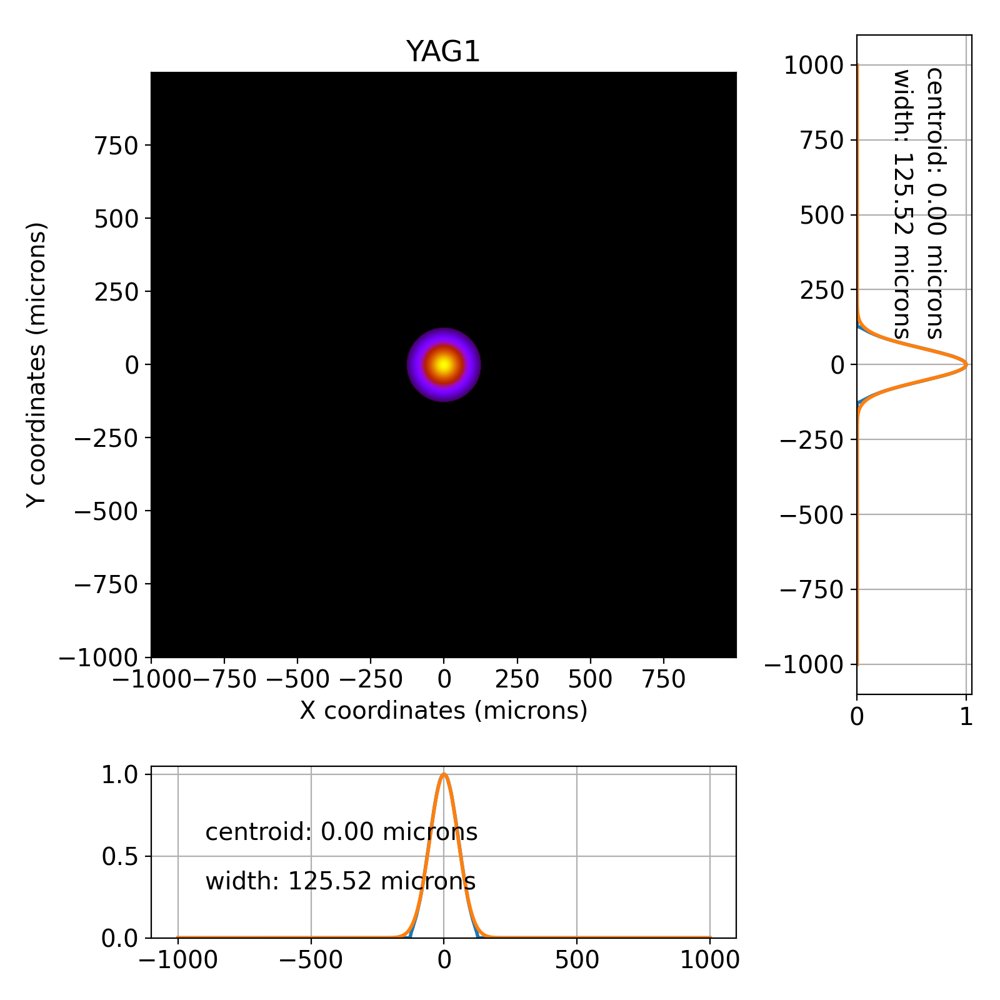

<IPython.core.display.Javascript object>


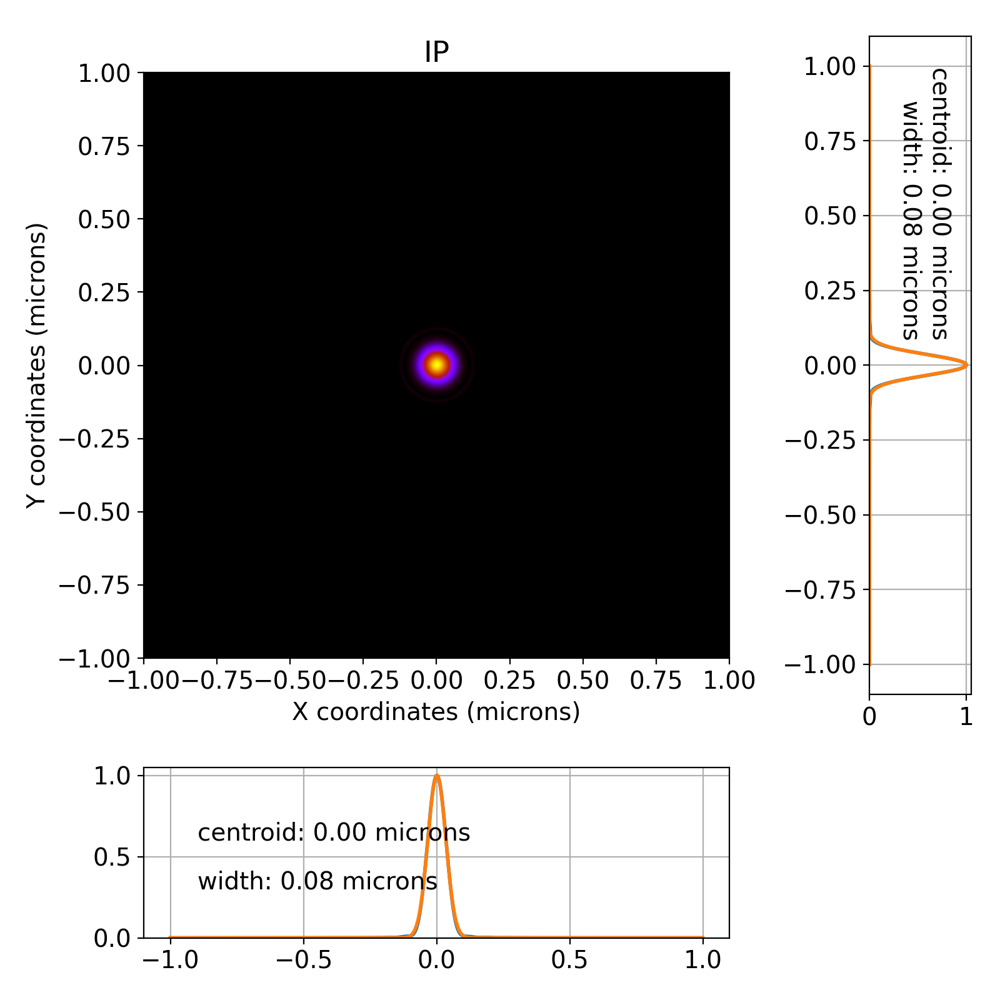

<IPython.core.display.Javascript object>


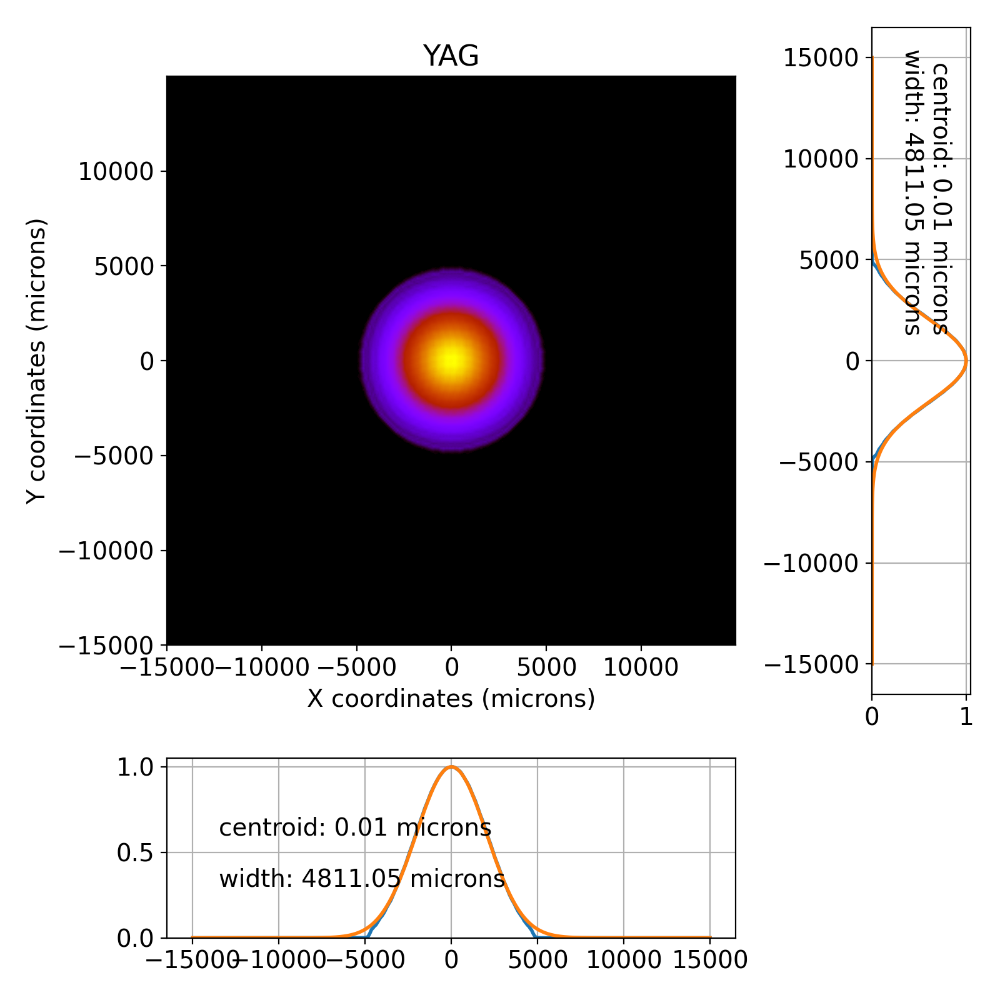

In [53]:
b2 = XPP.propagate_beamline(b1)
XPP.YAG1.view_beam()
XPP.IP.view_beam()
XPP.YAG.view_beam()

<IPython.core.display.Javascript object>


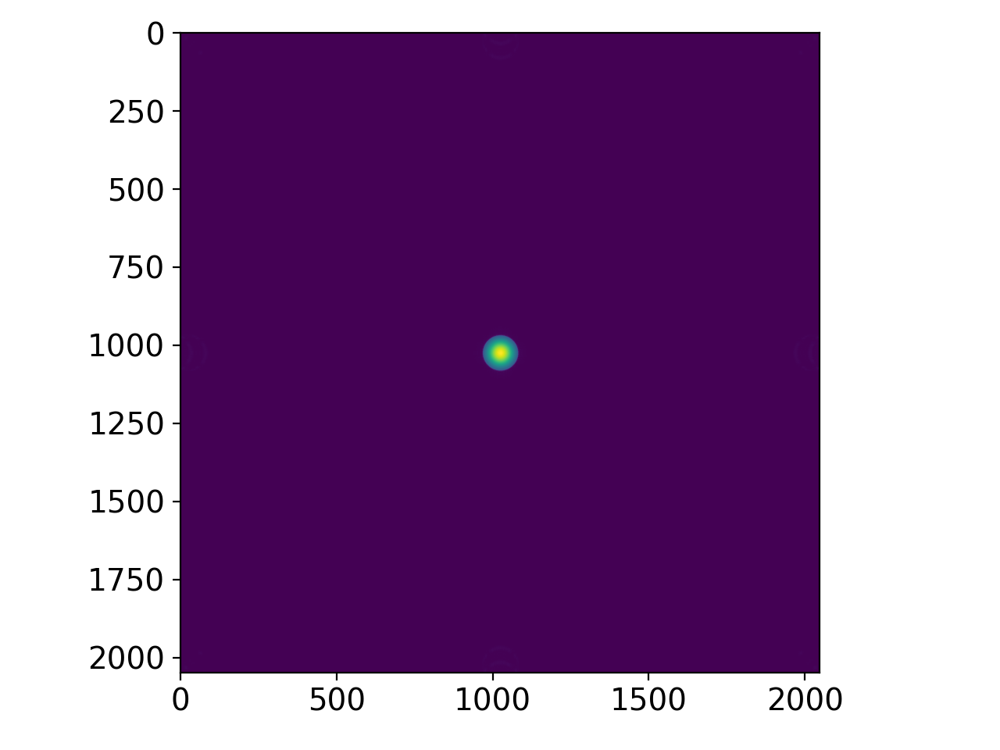

In [55]:
plt.figure()
plt.imshow(np.abs(b2.wave))

In [47]:
print(b1.scaleFactor)

8


<IPython.core.display.Javascript object>


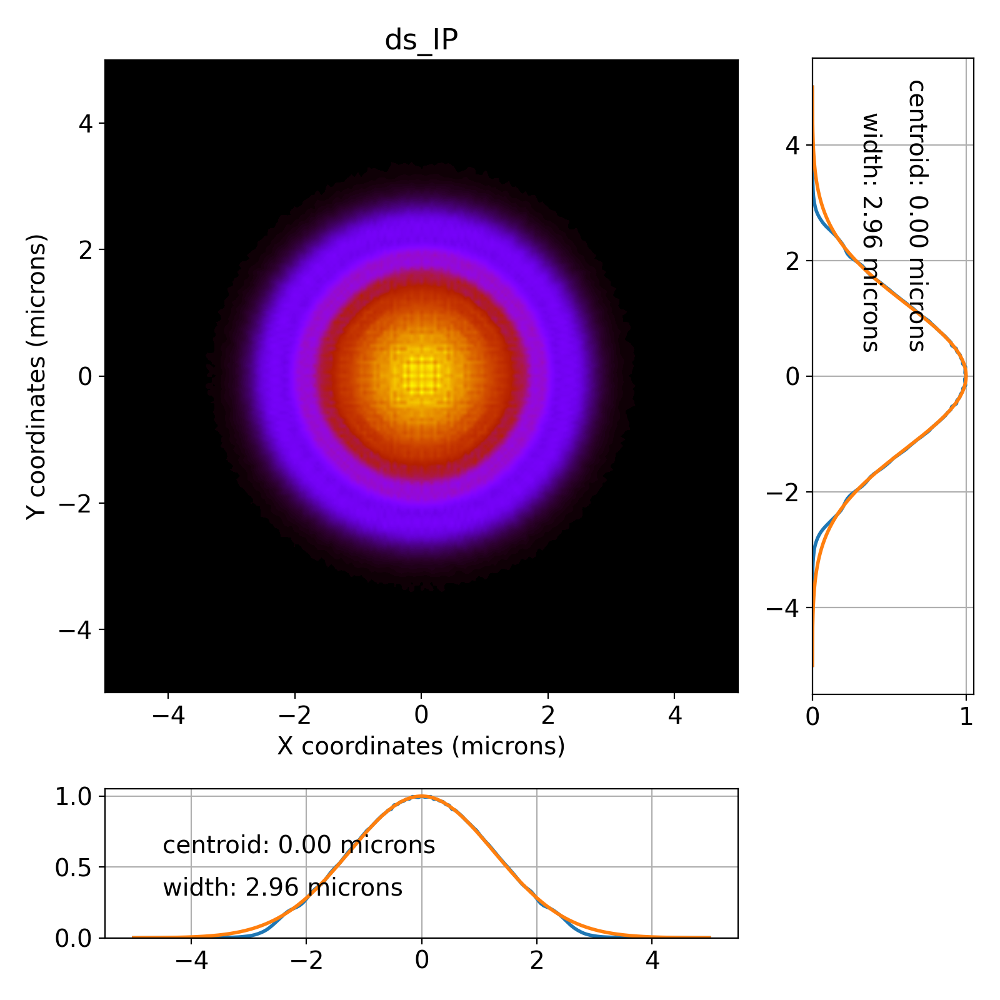

In [56]:
ds_IP.view_beam()

In [62]:
ds_IP.dx
print(b2.lambda0)

1.4088636363636366e-10


In [66]:
test_complex.shape

(2048, 2048)

<IPython.core.display.Javascript object>


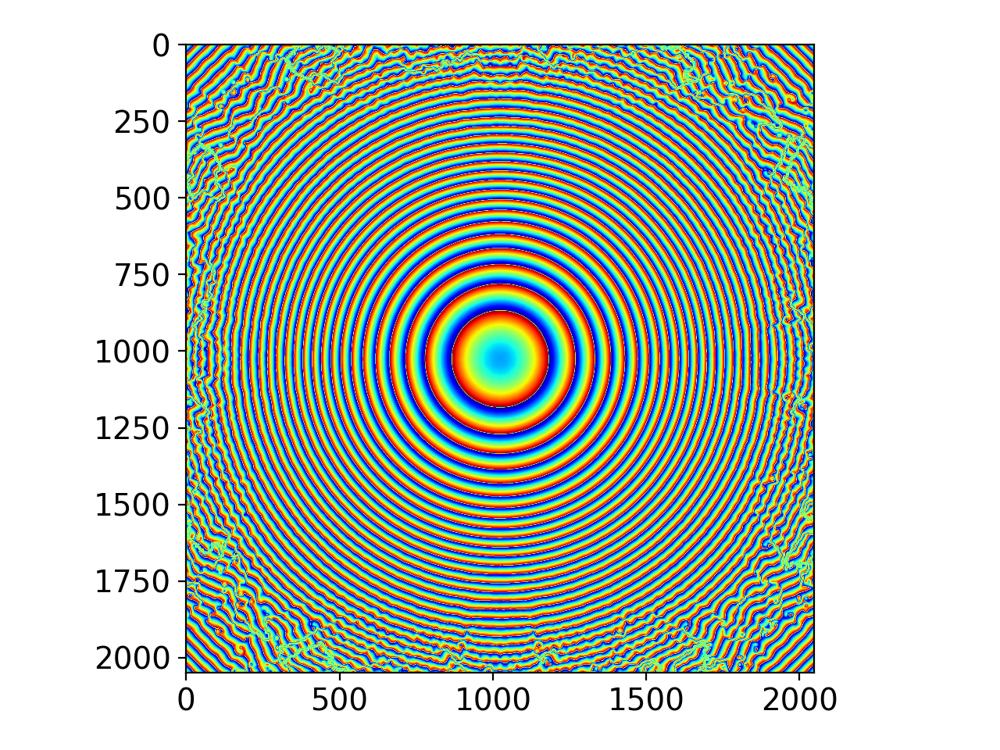

<IPython.core.display.Javascript object>


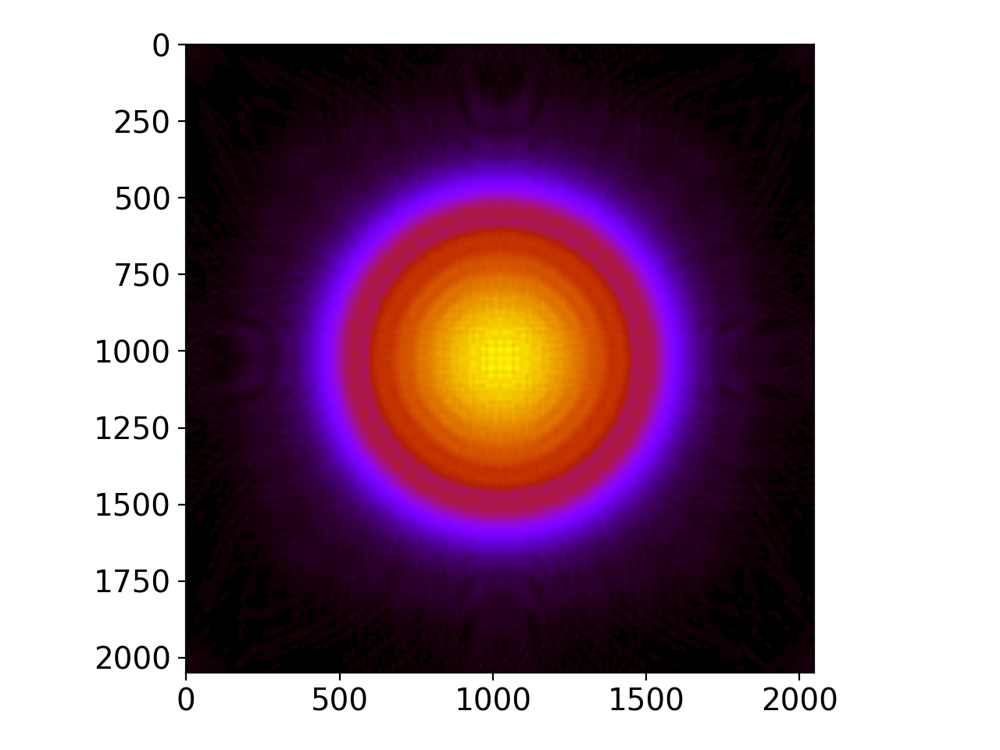

In [58]:
test, zx,zy,cx,cy = ds_IP.complex_beam()
quadPhase = np.exp(1j*np.pi/lambda0*((ds_IP.xx-cx)**2/zx+(ds_IP.yy-cy)**2/zy))

test_complex = test*quadPhase

plt.figure()
plt.imshow(np.angle(test_complex),cmap=plt.get_cmap('jet'))
plt.figure()
plt.imshow(np.abs(test_complex),cmap=plt.get_cmap('gnuplot'))



In [67]:
file1 = 'perfect_lens.h5'
with h5py.File(file1,'w') as f:
    f.create_dataset('probe',data=test_complex)
    f.create_dataset('dx',data=ds_IP.dx)
    f.create_dataset('wavelength',data=b2.lambda0)

In [58]:
b1 = beam.Beam(beam_params=beam_params)

mr1l0 = optics.FlatMirror('mr1l0', length=1, alpha=2.1e-3, z=740,delta=0e-9)
mr2l0 = optics.FlatMirror('mr2l0', length=1, alpha=2.1e-3, z=747.286)

# Stack of 20 CRLs for tight focus
crl_list = []
for i in range(40):
    dx = (2*np.random.rand()-1)*10*1e-6*0
    dy = (2*np.random.rand()-1)*10*1e-6*0
    crl_list.append(optics.CRL('crl%d' % i, z=800+i*1e-3,dx=dx, dy=dy,shapeError=lens_shape))

IP = optics.PPM('IP', FOV=2e-6, z=crl_list[-1].z+129e-3)
ds_IP = optics.PPM('ds_IP', FOV=10e-6, z=IP.z+3e-3, calc_phase=True)

upstream_YAG = optics.PPM('YAG1',FOV=2e-3,z=800 + 52e-3)
downstream_YAG = optics.PPM('YAG', FOV=30e-3, z=805)


devices = [mr1l0,mr2l0,IP,ds_IP,downstream_YAG, upstream_YAG]
devices = devices + crl_list

XPP = beamline2d.Beamline(devices)

FWHM in x: 292.002692540614 microns
FWHM in y: 292.002692540614 microns
FWHM Divergence (x): 2.6 μrad
FWHM Divergence (y): 2.6 μrad
x is focused
y is focused
after mr1l0: 0.0042
after mr2l0: 0.0084


FWHM in x: 292.002692540614 microns
FWHM in y: 292.002692540614 microns
FWHM Divergence (x): 2.6 μrad
FWHM Divergence (y): 2.6 μrad
x is focused
y is focused
mr1l0
zx: 110.000000
zy: 110.000000
azimuth 4.20 mrad
drift1
global_x 0.00
global_y 0.00
x intersect: 3.0601e-02
component x: 3.0601e-02
y intersect: 0.0000e+00
component y: 0.0000e+00
delta z: 0.00
zRx: 128117036.75 microns
zRy: 128117036.75 microns
remaining distance: 7286064.26 microns
goal for zx: 117286064.26 microns
current zx: 110000000.00 microns
goal for zy: 117286064.26 microns
current zy: 110000000.00 microns
zx: 117.286064
zy: 117.286064
azimuth 4.20 mrad
mr2l0
zx: 117.286064
zy: 117.286064
azimuth 8.40 mrad
drift2
global_x 0.03
global_y 0.00
x intersect: 4.7341e-01
component x: 4.7341e-01
y intersect: 0.0000e+00
component y: 0.0000e+00
delta z: -0.00
zRx: 128117036.75 microns
zRy: 128117036.75 microns
remaining distance: 52715859.80 microns
goal for zx: 170001924.07 microns
current zx: 117286064.26 microns
goal for zy

zx: -0.401483
zy: -0.401483
azimuth 8.40 mrad
crl14
zRx: 6.43e-04
zRy: 6.43e-04
focal length: 5.68
zx: -0.374976
zy: -0.374976
azimuth 8.40 mrad
drift17
global_x 0.47
global_y 0.00
x intersect: 4.7354e-01
component x: 4.7354e-01
y intersect: 0.0000e+00
component y: 0.0000e+00
delta z: -0.00
zRx: 642.92 microns
zRy: 642.92 microns
remaining distance: 1000.04 microns
goal for zx: -373976.30 microns
current zx: -374976.33 microns
goal for zy: -373976.30 microns
current zy: -374976.33 microns
zx: -0.373976
zy: -0.373976
azimuth 8.40 mrad
crl15
zRx: 5.66e-04
zRy: 5.66e-04
focal length: 5.68
zx: -0.350873
zy: -0.350873
azimuth 8.40 mrad
drift18
global_x 0.47
global_y 0.00
x intersect: 4.7354e-01
component x: 4.7354e-01
y intersect: 0.0000e+00
component y: 0.0000e+00
delta z: -0.00
zRx: 565.94 microns
zRy: 565.94 microns
remaining distance: 1000.04 microns
goal for zx: -349873.10 microns
current zx: -350873.14 microns
goal for zy: -349873.10 microns
current zy: -350873.14 microns
zx: -0.34987

zRx: 1.57e-04
zRy: 1.57e-04
focal length: 5.68
zx: -0.173467
zy: -0.173467
azimuth 8.40 mrad
drift33
global_x 0.47
global_y 0.00
x intersect: 4.7367e-01
component x: 4.7367e-01
y intersect: 0.0000e+00
component y: 0.0000e+00
delta z: -0.00
zRx: 156.85 microns
zRy: 156.85 microns
remaining distance: 1000.04 microns
goal for zx: -172466.78 microns
current zx: -173466.81 microns
goal for zy: -172466.78 microns
current zy: -173466.81 microns
zx: -0.172467
zy: -0.172467
azimuth 8.40 mrad
crl31
zRx: 1.48e-04
zRy: 1.48e-04
focal length: 5.68
zx: -0.167384
zy: -0.167384
azimuth 8.40 mrad
drift34
global_x 0.47
global_y 0.00
x intersect: 4.7368e-01
component x: 4.7368e-01
y intersect: 0.0000e+00
component y: 0.0000e+00
delta z: -0.00
zRx: 147.74 microns
zRy: 147.74 microns
remaining distance: 1000.04 microns
goal for zx: -166384.02 microns
current zx: -167384.05 microns
goal for zy: -166384.02 microns
current zy: -167384.05 microns
zx: -0.166384
zy: -0.166384
azimuth 8.40 mrad
crl32
zRx: 1.39e-0

<IPython.core.display.Javascript object>


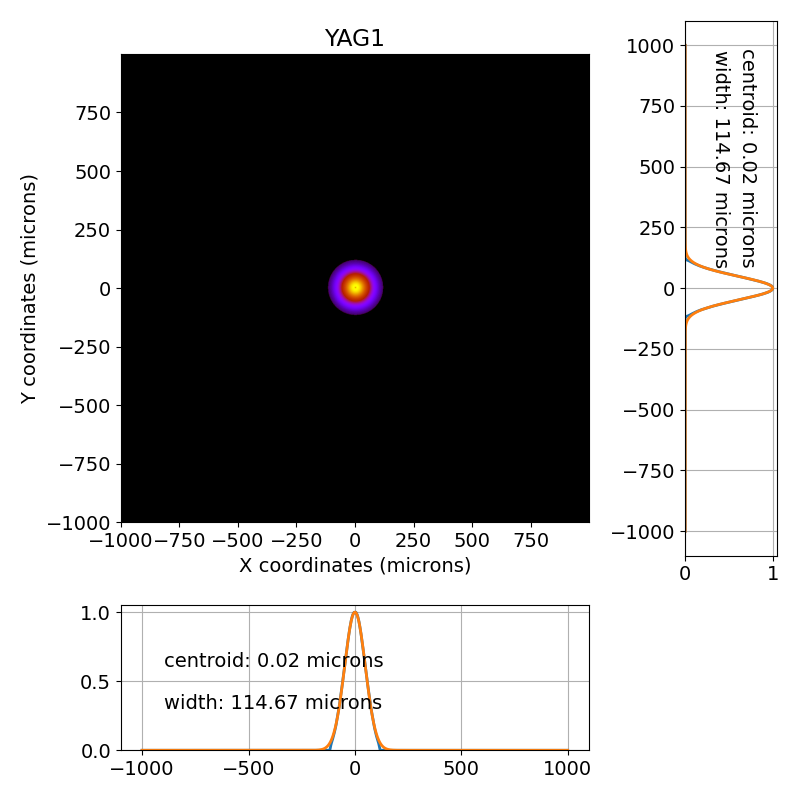

<IPython.core.display.Javascript object>


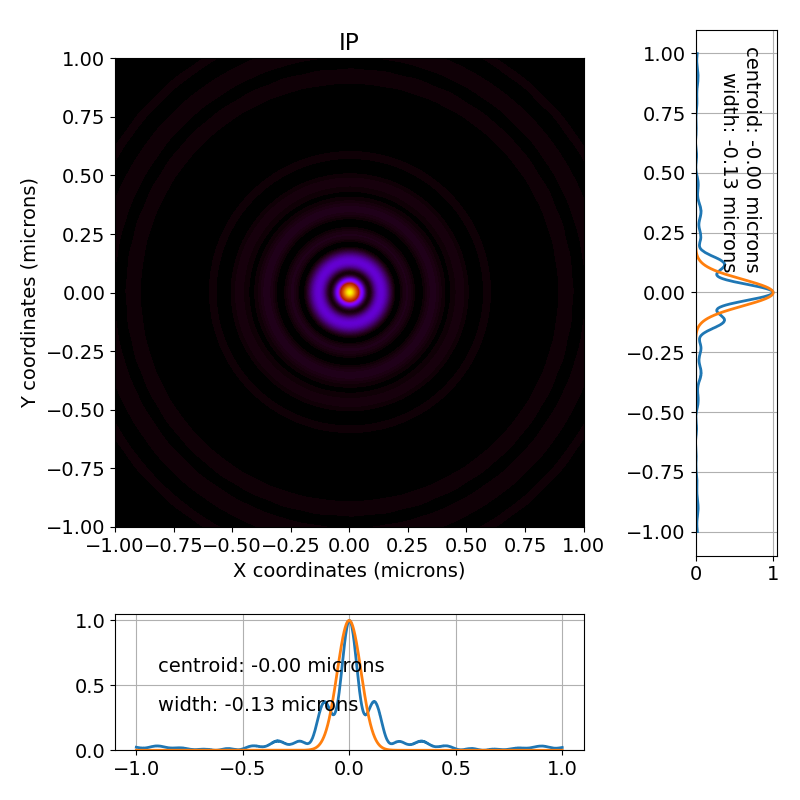

<IPython.core.display.Javascript object>


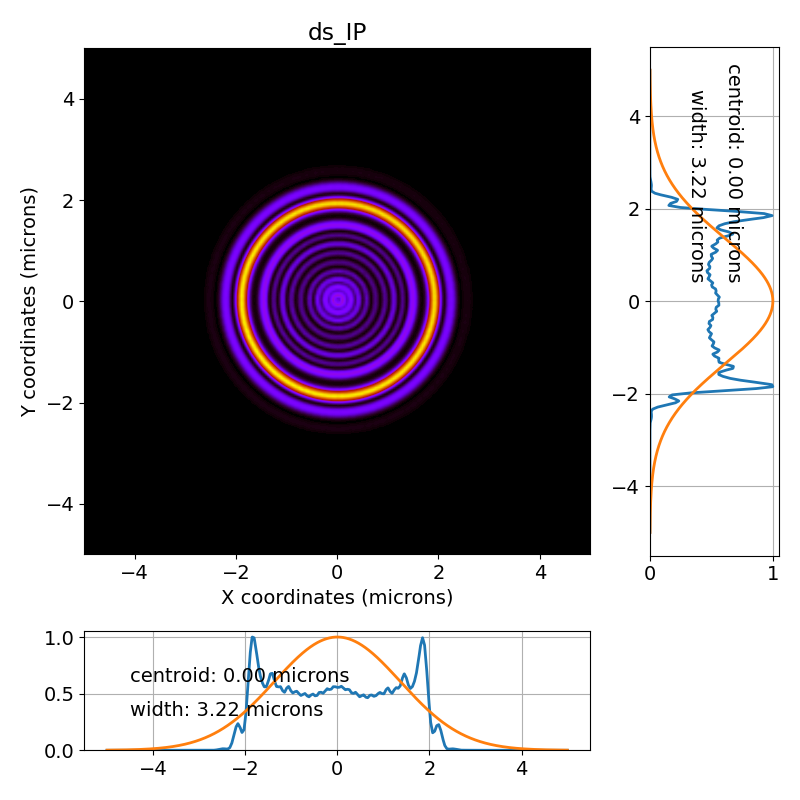

<IPython.core.display.Javascript object>


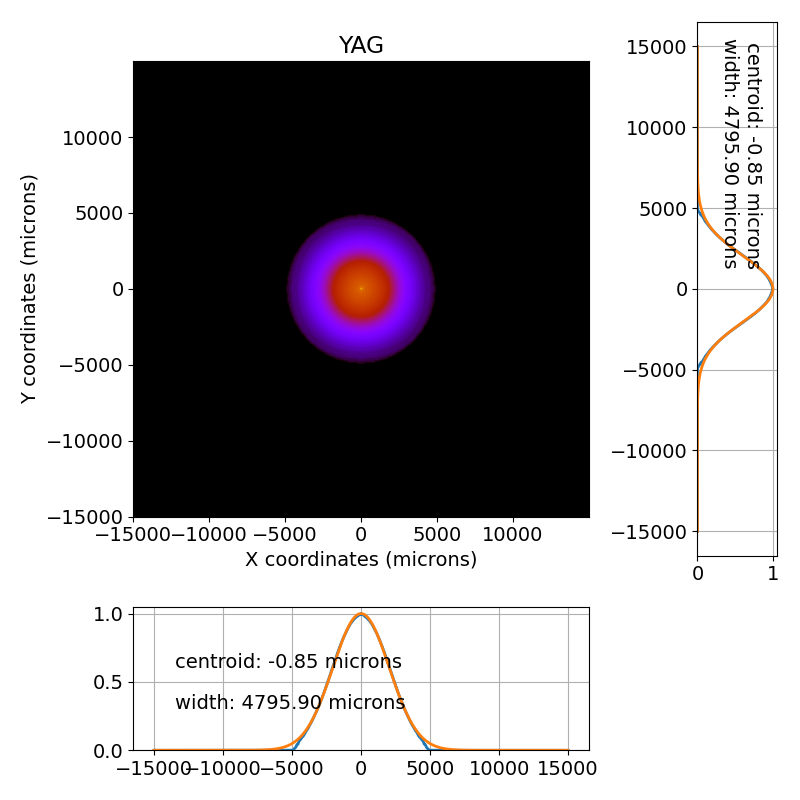

In [59]:
b2 = XPP.propagate_beamline(b1)
XPP.YAG1.view_beam()
XPP.IP.view_beam()
XPP.ds_IP.view_beam()
XPP.YAG.view_beam()

<IPython.core.display.Javascript object>


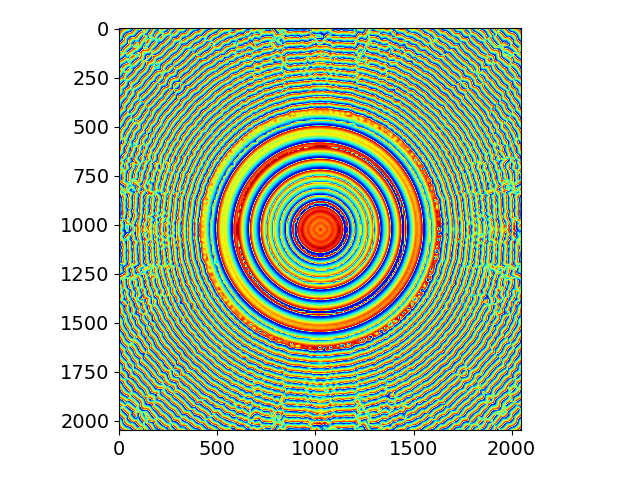

<IPython.core.display.Javascript object>


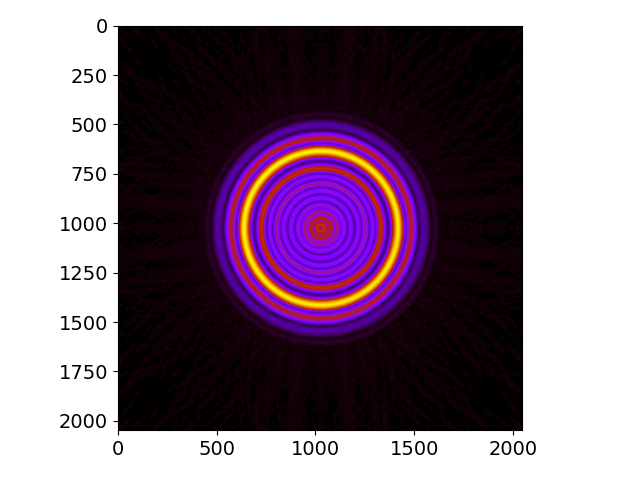

In [60]:
test, zx,zy,cx,cy = ds_IP.complex_beam()
quadPhase = np.exp(1j*np.pi/lambda0*(ds_IP.xx**2/zx+ds_IP.yy**2/zy))
plt.figure()
plt.imshow(np.angle(test*quadPhase),cmap=plt.get_cmap('jet'))
plt.figure()
plt.imshow(np.abs(test),cmap=plt.get_cmap('gnuplot'))

In [46]:
test_complex = test*quadPhase

file1 = 'aberrated_lens_randomized2.h5'
with h5py.File(file1,'w') as f:
    f.create_dataset('probe',data=test_complex)
    f.create_dataset('dx',data=ds_IP.dx)
    f.create_dataset('wavelength',data=b2.lambda0)

In [72]:
b2.scaleFactor

8

<IPython.core.display.Javascript object>


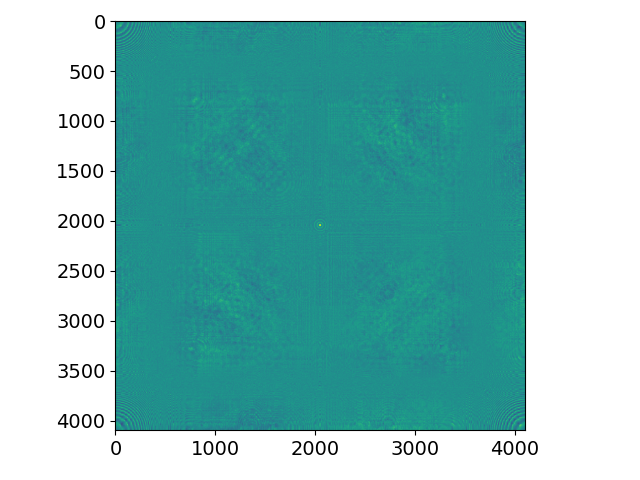

In [38]:
plt.figure()
plt.imshow(np.angle(b2.wave))

In [68]:
b1 = beam.Beam(beam_params=beam_params)

mr1l0 = optics.FlatMirror('mr1l0', length=1, alpha=2.1e-3, z=740,delta=0e-9)
mr2l0 = optics.FlatMirror('mr2l0', length=1, alpha=2.1e-3, z=747.286)

# Stack of 20 CRLs for tight focus
crl_list = []
for i in range(40):
    dx = (2*np.random.rand()-1)*10*1e-6
    dy = (2*np.random.rand()-1)*10*1e-6
    crl_list.append(optics.CRL('crl%d' % i, z=800+i*1e-3,dx=dx, dy=dy, shapeError=lens_shape))
    
phase_plate = optics.CRL('phase_plate', z=crl_list[-1].z+5e-3, roc=1e6, diameter=254e-6, shapeError=-lens_shape*40)

IP = optics.PPM('IP', FOV=2e-6, z=crl_list[-1].z+129e-3)
ds_IP = optics.PPM('ds_IP', FOV=10e-6, z=IP.z+3e-3, calc_phase=True)

upstream_YAG = optics.PPM('YAG1',FOV=2e-3,z=800 + 42e-3, calc_phase=True)
downstream_YAG = optics.PPM('YAG', FOV=30e-3, z=805)


devices = [mr1l0,mr2l0, phase_plate, IP,ds_IP,downstream_YAG, upstream_YAG]
devices = devices + crl_list

XPP = beamline2d.Beamline(devices)

FWHM in x: 292.002692540614 microns
FWHM in y: 292.002692540614 microns
FWHM Divergence (x): 2.6 μrad
FWHM Divergence (y): 2.6 μrad
x is focused
y is focused
after mr1l0: 0.0042
after mr2l0: 0.0084


FWHM in x: 292.002692540614 microns
FWHM in y: 292.002692540614 microns
FWHM Divergence (x): 2.6 μrad
FWHM Divergence (y): 2.6 μrad
x is focused
y is focused
mr1l0
zx: 110.000000
zy: 110.000000
azimuth 4.20 mrad
drift1
global_x 0.00
global_y 0.00
x intersect: 3.0601e-02
component x: 3.0601e-02
y intersect: 0.0000e+00
component y: 0.0000e+00
delta z: 0.00
zRx: 128117036.75 microns
zRy: 128117036.75 microns
remaining distance: 7286064.26 microns
goal for zx: 117286064.26 microns
current zx: 110000000.00 microns
goal for zy: 117286064.26 microns
current zy: 110000000.00 microns
zx: 117.286064
zy: 117.286064
azimuth 4.20 mrad
mr2l0
zx: 117.286064
zy: 117.286064
azimuth 8.40 mrad
drift2
global_x 0.03
global_y 0.00
x intersect: 4.7341e-01
component x: 4.7341e-01
y intersect: 0.0000e+00
component y: 0.0000e+00
delta z: -0.00
zRx: 128117036.75 microns
zRy: 128117036.75 microns
remaining distance: 52715859.80 microns
goal for zx: 170001924.07 microns
current zx: 117286064.26 microns
goal for zy

zx: -0.401483
zy: -0.401483
azimuth 8.40 mrad
crl14
zRx: 6.43e-04
zRy: 6.43e-04
focal length: 5.68
zx: -0.374976
zy: -0.374976
azimuth 8.40 mrad
drift17
global_x 0.47
global_y -0.00
x intersect: 4.7354e-01
component x: 4.7354e-01
y intersect: -1.4140e-08
component y: 0.0000e+00
delta z: -0.00
zRx: 642.92 microns
zRy: 642.92 microns
remaining distance: 1000.04 microns
goal for zx: -373976.30 microns
current zx: -374976.33 microns
goal for zy: -373976.30 microns
current zy: -374976.33 microns
zx: -0.373976
zy: -0.373976
azimuth 8.40 mrad
crl15
zRx: 5.66e-04
zRy: 5.66e-04
focal length: 5.68
zx: -0.350873
zy: -0.350873
azimuth 8.40 mrad
drift18
global_x 0.47
global_y -0.00
x intersect: 4.7354e-01
component x: 4.7354e-01
y intersect: -1.6951e-08
component y: 0.0000e+00
delta z: -0.00
zRx: 565.94 microns
zRy: 565.94 microns
remaining distance: 1000.04 microns
goal for zx: -349873.10 microns
current zx: -350873.14 microns
goal for zy: -349873.10 microns
current zy: -350873.14 microns
zx: -0.3

zRx: 1.57e-04
zRy: 1.57e-04
focal length: 5.68
zx: -0.173467
zy: -0.173467
azimuth 8.40 mrad
drift33
global_x 0.47
global_y -0.00
x intersect: 4.7367e-01
component x: 4.7367e-01
y intersect: -4.0673e-08
component y: 0.0000e+00
delta z: -0.00
zRx: 156.85 microns
zRy: 156.85 microns
remaining distance: 1000.04 microns
goal for zx: -172466.78 microns
current zx: -173466.82 microns
goal for zy: -172466.78 microns
current zy: -173466.82 microns
zx: -0.172467
zy: -0.172467
azimuth 8.40 mrad
crl31
zRx: 1.48e-04
zRy: 1.48e-04
focal length: 5.68
zx: -0.167384
zy: -0.167384
azimuth 8.40 mrad
drift34
global_x 0.47
global_y -0.00
x intersect: 4.7368e-01
component x: 4.7368e-01
y intersect: -4.6561e-08
component y: 0.0000e+00
delta z: -0.00
zRx: 147.74 microns
zRy: 147.74 microns
remaining distance: 1000.04 microns
goal for zx: -166384.02 microns
current zx: -167384.05 microns
goal for zy: -166384.02 microns
current zy: -167384.05 microns
zx: -0.166384
zy: -0.166384
azimuth 8.40 mrad
crl32
zRx: 1.3

<IPython.core.display.Javascript object>


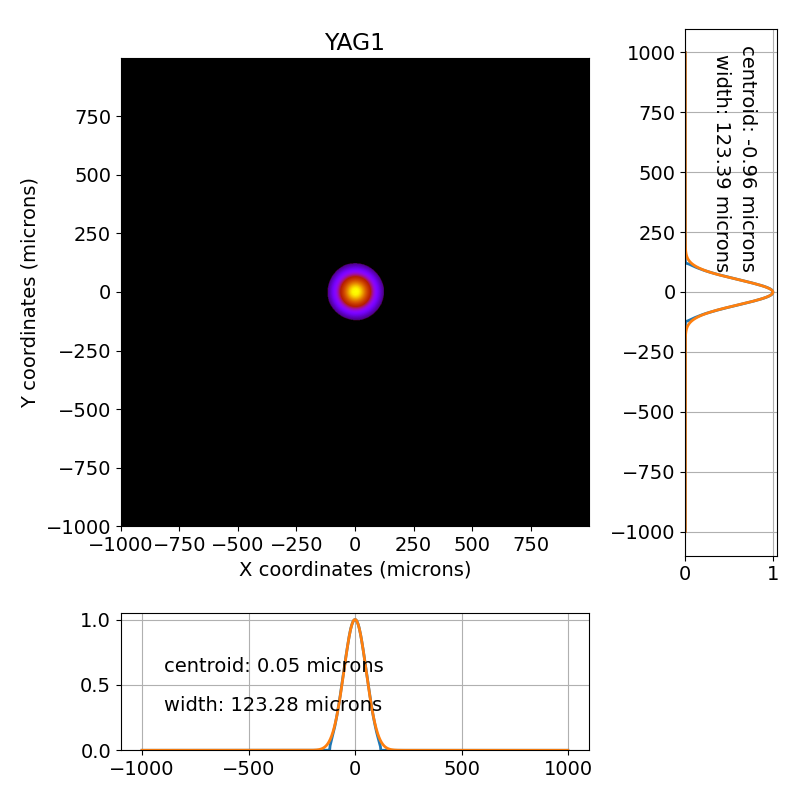

<IPython.core.display.Javascript object>


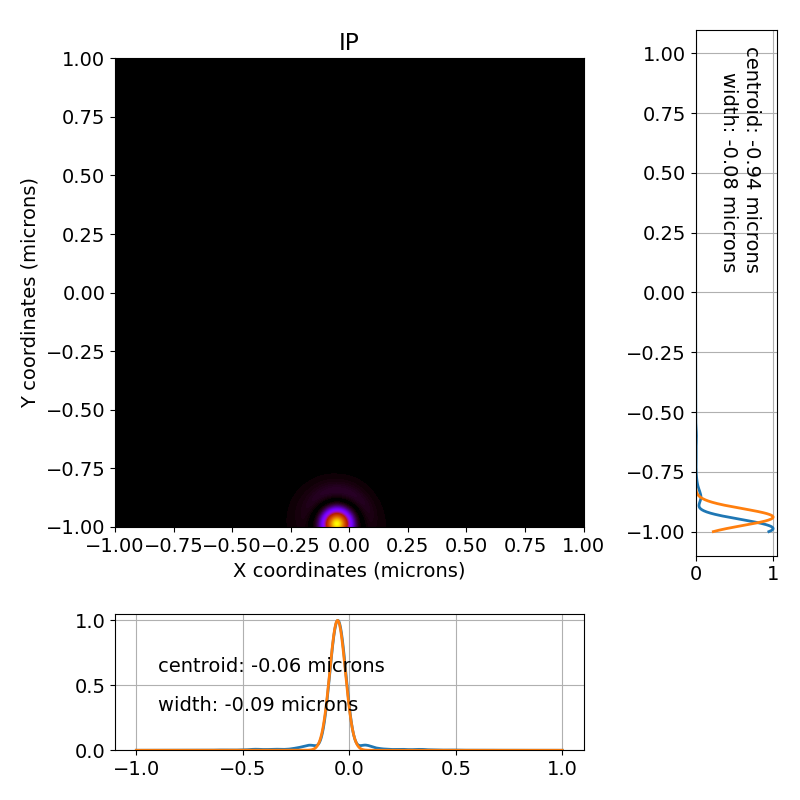

<IPython.core.display.Javascript object>


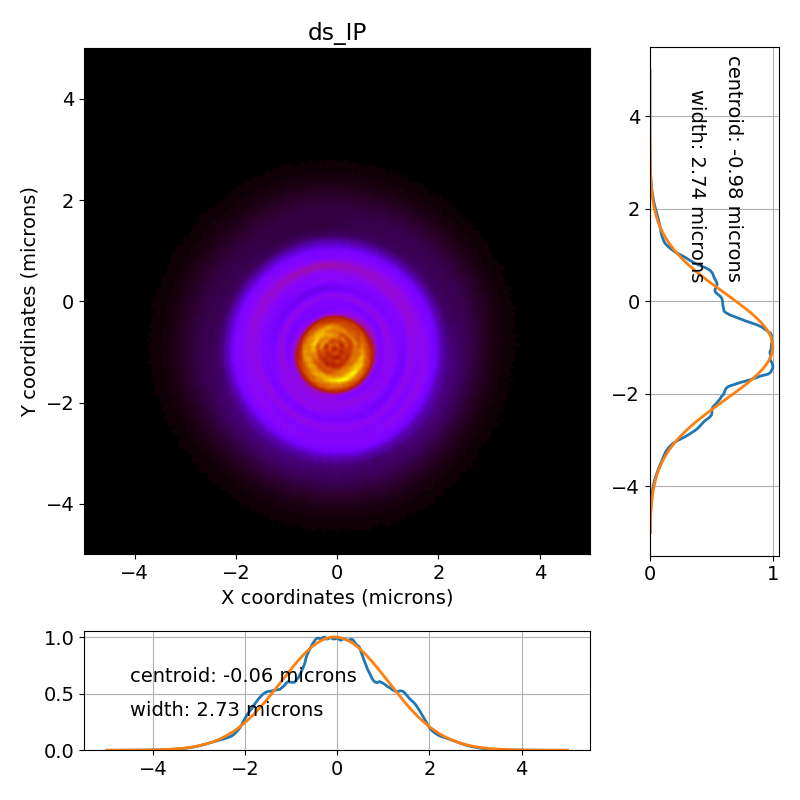

<IPython.core.display.Javascript object>


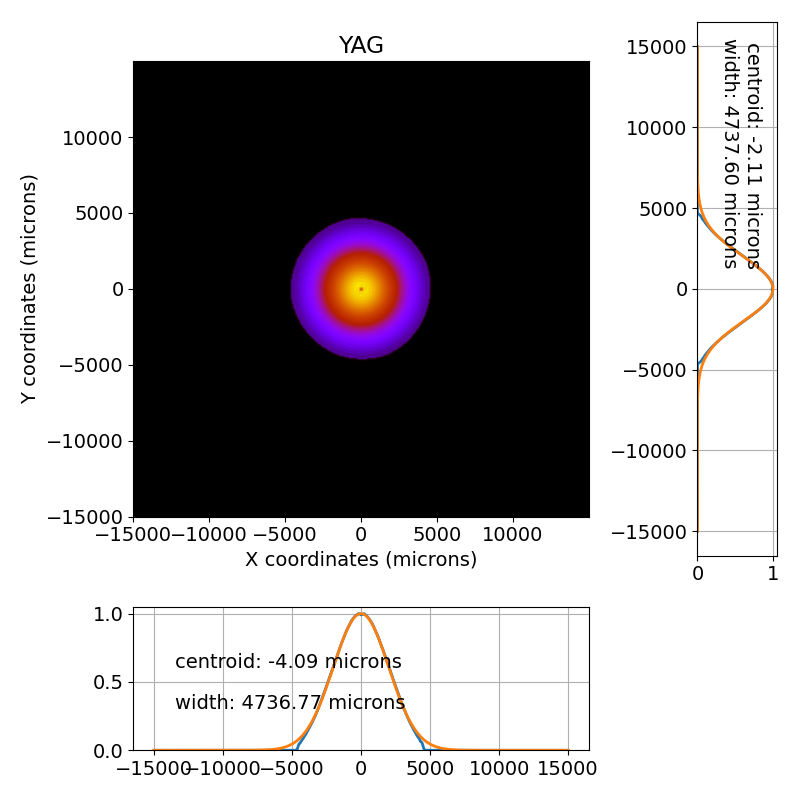

In [69]:
b2 = XPP.propagate_beamline(b1)
XPP.YAG1.view_beam()
XPP.IP.view_beam()
XPP.ds_IP.view_beam()
XPP.YAG.view_beam()

<IPython.core.display.Javascript object>


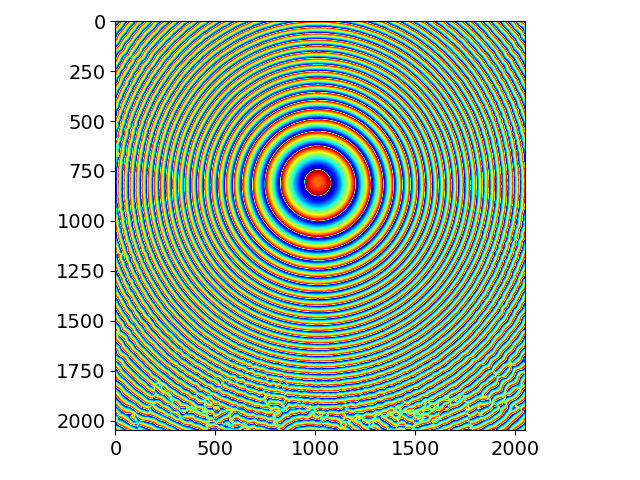

<IPython.core.display.Javascript object>


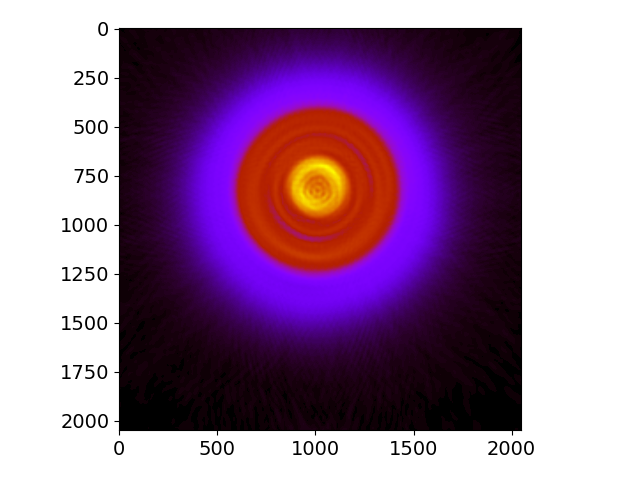

In [70]:
test, zx,zy,cx,cy = XPP.ds_IP.complex_beam()
quadPhase = np.exp(1j*np.pi/lambda0*((ds_IP.xx-cx)**2/zx+(ds_IP.yy-cy)**2/zy))
plt.figure()
plt.imshow(np.angle(test*quadPhase),cmap=plt.get_cmap('jet'))
plt.figure()
plt.imshow(np.abs(test),cmap=plt.get_cmap('gnuplot'))

In [71]:
test_complex = test*quadPhase

file1 = 'aberrated_lens_phase_plate_randomized.h5'
with h5py.File(file1,'w') as f:
    f.create_dataset('probe',data=test_complex)
    f.create_dataset('dx',data=ds_IP.dx)
    f.create_dataset('wavelength',data=b2.lambda0)

/Users/seaberg/beamline/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


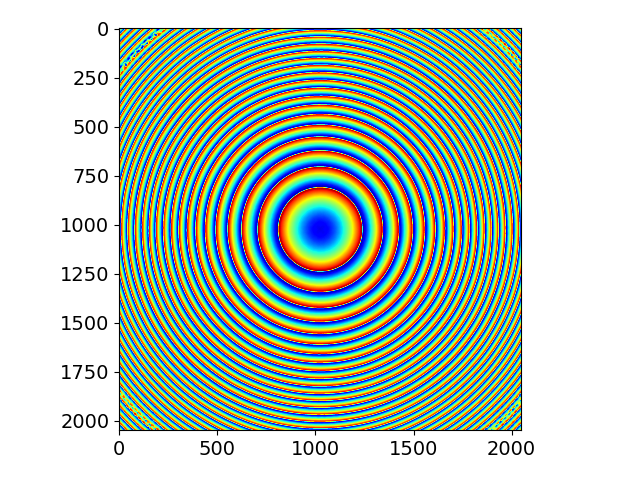

/Users/seaberg/beamline/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


<IPython.core.display.Javascript object>


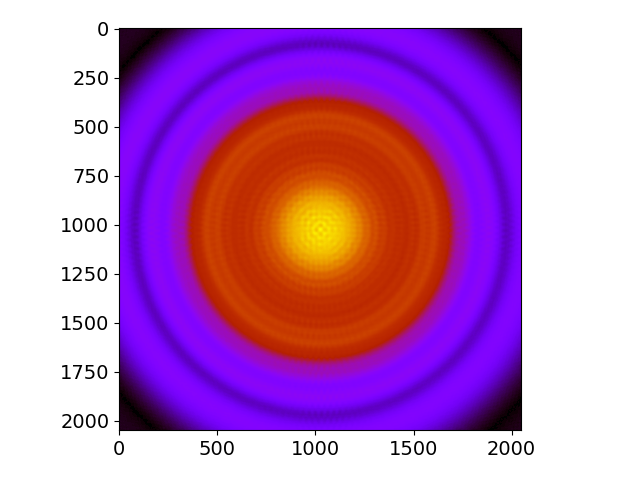

In [170]:
test, zx,zy,cx,cy = ds_IP.complex_beam()
quadPhase = np.exp(1j*np.pi/lambda0*((ds_IP.xx-cx)**2/zx+(ds_IP.yy-cy)**2/zy))
plt.figure()
plt.imshow(np.angle(test*quadPhase),cmap=plt.get_cmap('jet'))
plt.figure()
plt.imshow(np.abs(test),cmap=plt.get_cmap('gnuplot'))

In [154]:
b1 = beam.Beam(beam_params=beam_params)

mr1l0 = optics.FlatMirror('mr1l0', length=1, alpha=2.1e-3, z=740,delta=0e-9)
mr2l0 = optics.FlatMirror('mr2l0', length=1, alpha=2.1e-3, z=747.286)

# Stack of 20 CRLs for tight focus
crl_list = []
for i in range(20):
    dx = (2*np.random.rand()-1)*5*1e-6
    dy = (2*np.random.rand()-1)*5*1e-6
    crl_list.append(optics.CRL('crl%d' % i, z=800+i*1e-3,dx=dx*0, dy=dy*0, shapeError=lens_shape))
    
phase_plate = optics.CRL('phase_plate', z=crl_list[-1].z+5e-3, roc=1e6, shapeError=-lens_shape*20)

IP = optics.PPM('IP', FOV=5e-6, z=crl_list[-1].z+278.3e-3)
ds_IP = optics.PPM('ds_IP', FOV=10e-6, z=IP.z+5e-3, calc_phase=True)

upstream_YAG = optics.PPM('YAG1',FOV=2e-3,z=800 + 22e-3, calc_phase=True)
downstream_YAG = optics.PPM('YAG', FOV=30e-3, z=805)


devices = [mr1l0,mr2l0, phase_plate, IP,ds_IP,downstream_YAG, upstream_YAG]
devices = devices + crl_list

XPP = beamline2d.Beamline(devices)

FWHM in x: 388.4667023075743 microns
FWHM in y: 388.4667023075743 microns
FWHM Divergence (x): 3.5 μrad
FWHM Divergence (y): 3.5 μrad
x is focused
y is focused


FWHM in x: 388.4667023075743 microns
FWHM in y: 388.4667023075743 microns
FWHM Divergence (x): 3.5 μrad
FWHM Divergence (y): 3.5 μrad
x is focused
y is focused
mr1l0
drift1
zRx: 144131666.34 microns
zRy: 144131666.34 microns
remaining distance: 7286000.00 microns
goal for zx: 117286000.00 microns
current zx: 110000000.00 microns
goal for zy: 117286000.00 microns
current zy: 110000000.00 microns
mr2l0
drift2
zRx: 144131666.34 microns
zRy: 144131666.34 microns
remaining distance: 52714000.00 microns
goal for zx: 170000000.00 microns
current zx: 117286000.00 microns
goal for zy: 170000000.00 microns
current zy: 117286000.00 microns
current step size: 26845666.34 microns
x becomes unfocused
y becomes unfocused
zRx: 144131666.34 microns
zRy: 144131666.34 microns
remaining distance: 25868333.66 microns
goal for zx: 170000000.00 microns
current zx: 144131666.34 microns
goal for zy: 170000000.00 microns
current zy: 144131666.34 microns
crl0
focal length: 5.68
drift3
zRx: 1224350.81 microns
zRy

/Users/seaberg/Python/lcls_beamline_toolbox/lcls_beamline_toolbox/xraybeamline2d/optics.py:2892: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(8, 8))


<IPython.core.display.Javascript object>


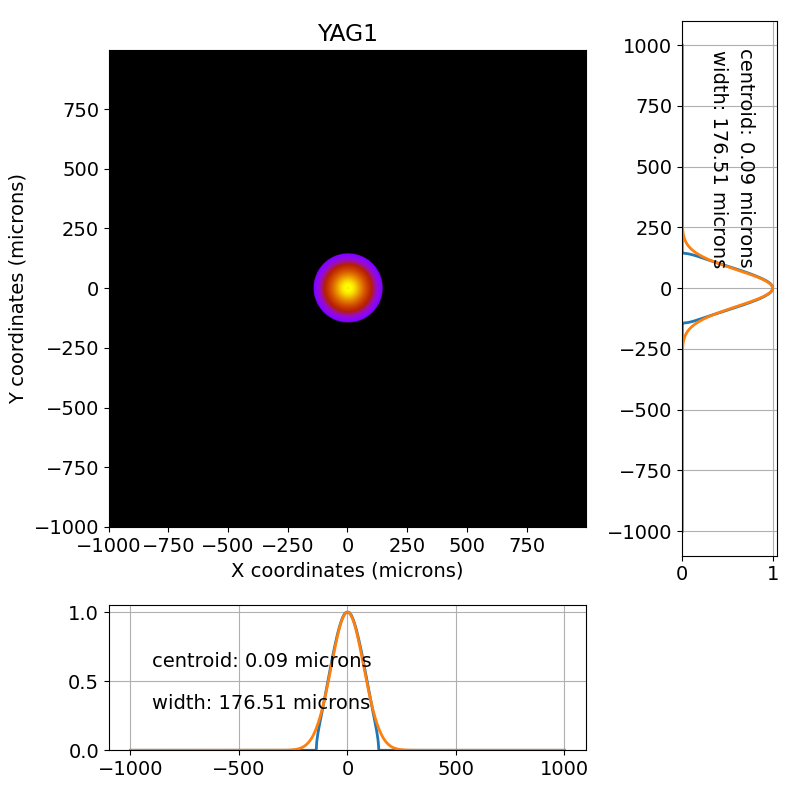

/Users/seaberg/Python/lcls_beamline_toolbox/lcls_beamline_toolbox/xraybeamline2d/optics.py:2892: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(8, 8))


<IPython.core.display.Javascript object>


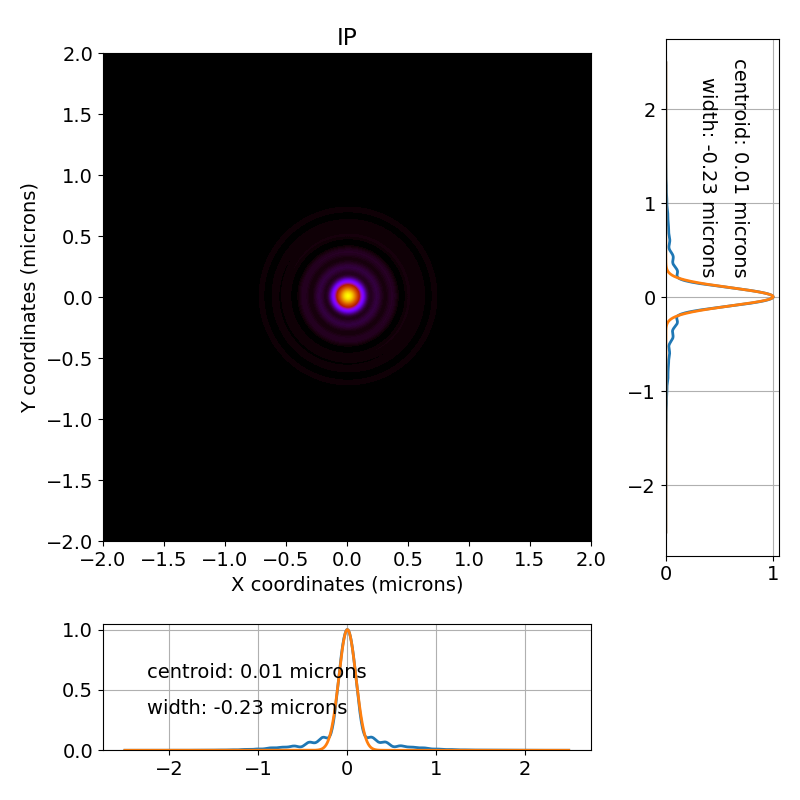

/Users/seaberg/Python/lcls_beamline_toolbox/lcls_beamline_toolbox/xraybeamline2d/optics.py:2892: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(8, 8))


<IPython.core.display.Javascript object>


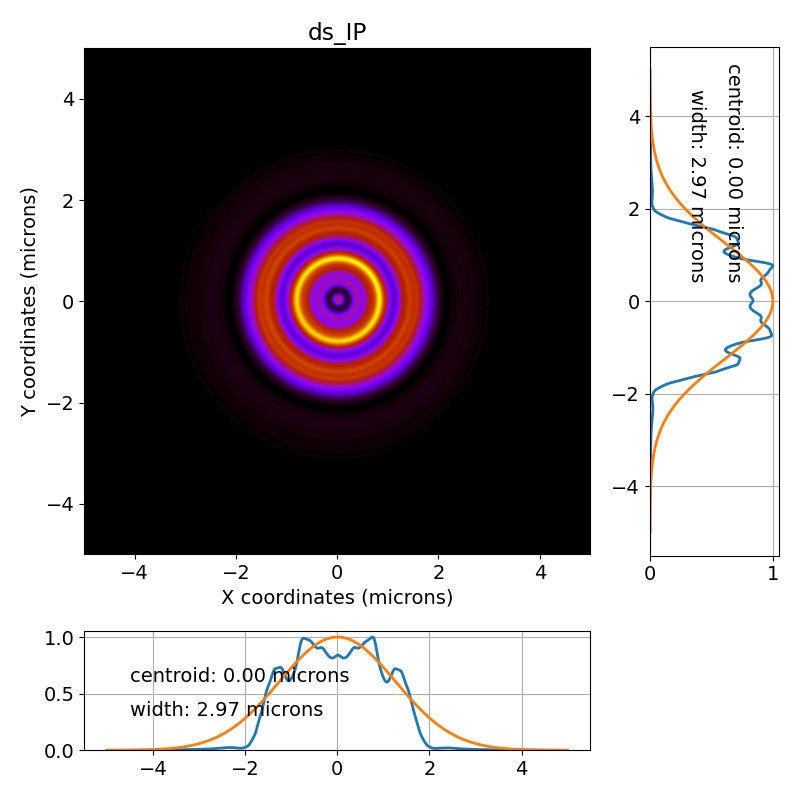

/Users/seaberg/Python/lcls_beamline_toolbox/lcls_beamline_toolbox/xraybeamline2d/optics.py:2892: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(8, 8))


<IPython.core.display.Javascript object>


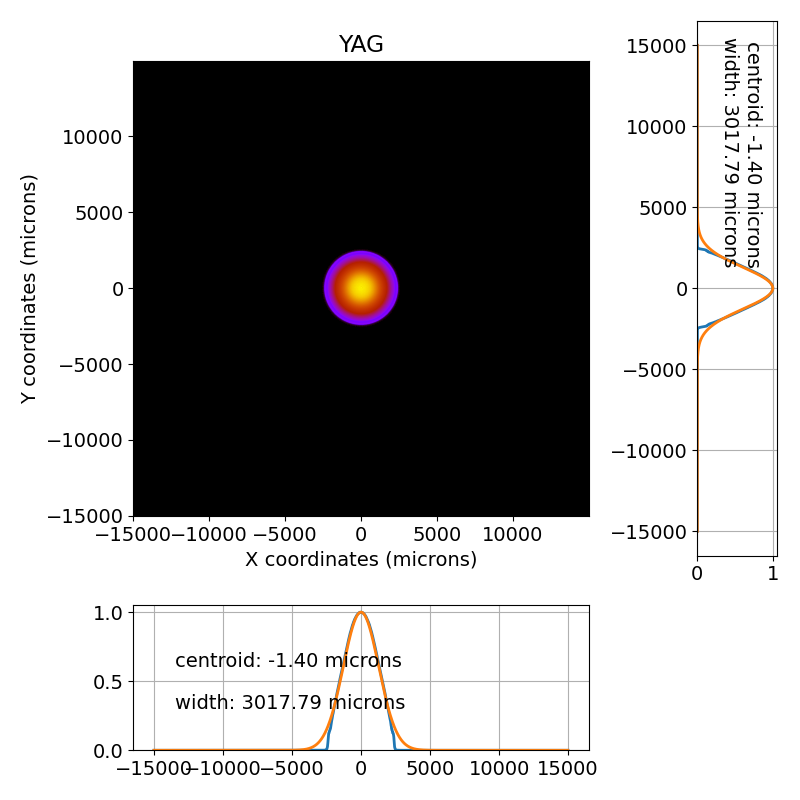

In [155]:
b2 = XPP.propagate_beamline(b1)
XPP.YAG1.view_beam()
XPP.IP.view_beam()
XPP.ds_IP.view_beam()
XPP.YAG.view_beam()

/Users/seaberg/beamline/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


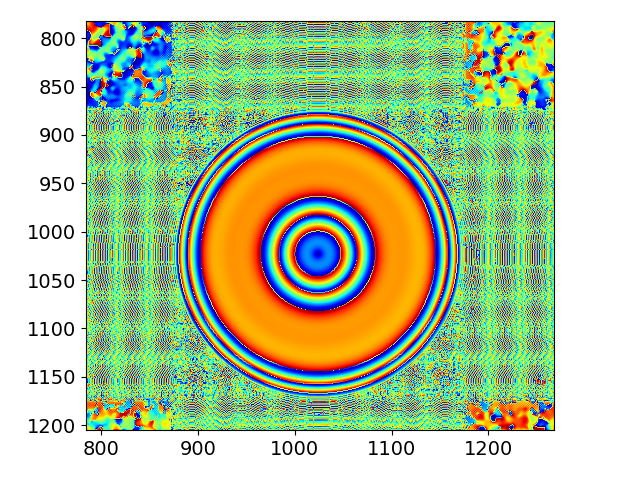

/Users/seaberg/beamline/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


<IPython.core.display.Javascript object>


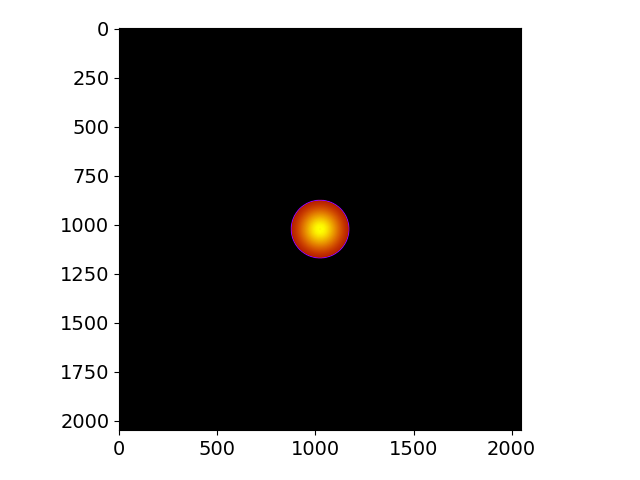

In [156]:
test, zx,zy,cx,cy = XPP.YAG1.complex_beam()
quadPhase = np.exp(1j*np.pi/lambda0*((ds_IP.xx-cx)**2/zx+(ds_IP.yy-cy)**2/zy))
plt.figure()
plt.imshow(np.angle(test),cmap=plt.get_cmap('jet'))
plt.figure()
plt.imshow(np.abs(test),cmap=plt.get_cmap('gnuplot'))

<IPython.core.display.Javascript object>


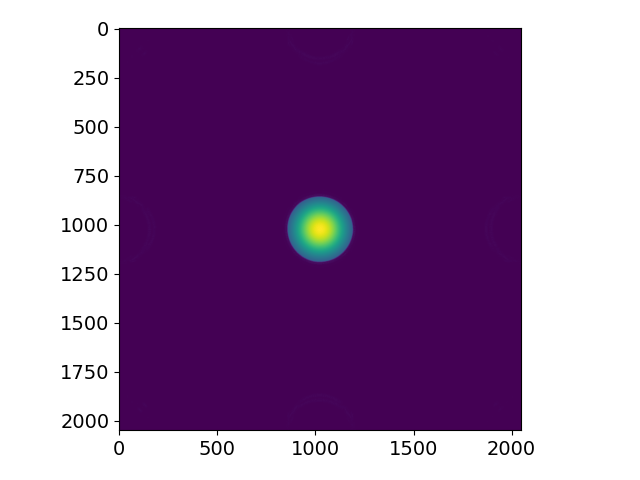

In [137]:
plt.figure()
plt.imshow(np.abs(b2.wave))

<IPython.core.display.Javascript object>


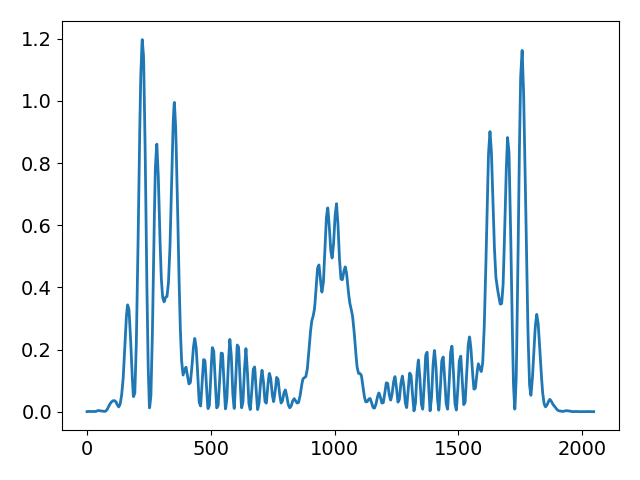

In [90]:
plt.figure()
plt.plot(ds_IP.profile[1024,:])

In [16]:
beam_params['photonEnergy'] = 9500

pulse_test = beam.Pulse(beam_params=beam_params, tau=10, time_window=100)

In [17]:
pulse_test.energy

array([9499.53501723, 9499.57930131, 9499.62358538, 9499.66786945,
       9499.71215353, 9499.7564376 , 9499.80072167, 9499.84500574,
       9499.88928982, 9499.93357389, 9499.97785796, 9500.02214204,
       9500.06642611, 9500.11071018, 9500.15499426, 9500.19927833,
       9500.2435624 , 9500.28784647, 9500.33213055, 9500.37641462,
       9500.42069869, 9500.46498277])

In [18]:
.41*2000

820.0